In [1]:
import pandas as pd
df_train = pd.read_csv('train.csv')
df_test = pd.read_csv('test.csv')

x = df_train['id_code']
y = df_train['diagnosis']

#x, y = shuffle(x, y, random_state=SEED)

(3112,) (3112,) (550,) (550,)


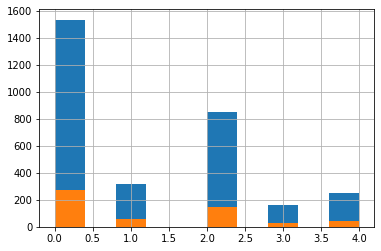

In [2]:
from sklearn.model_selection import train_test_split
SEED=5000
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                              stratify=y, random_state=SEED)
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)
train_y.hist()
valid_y.hist()

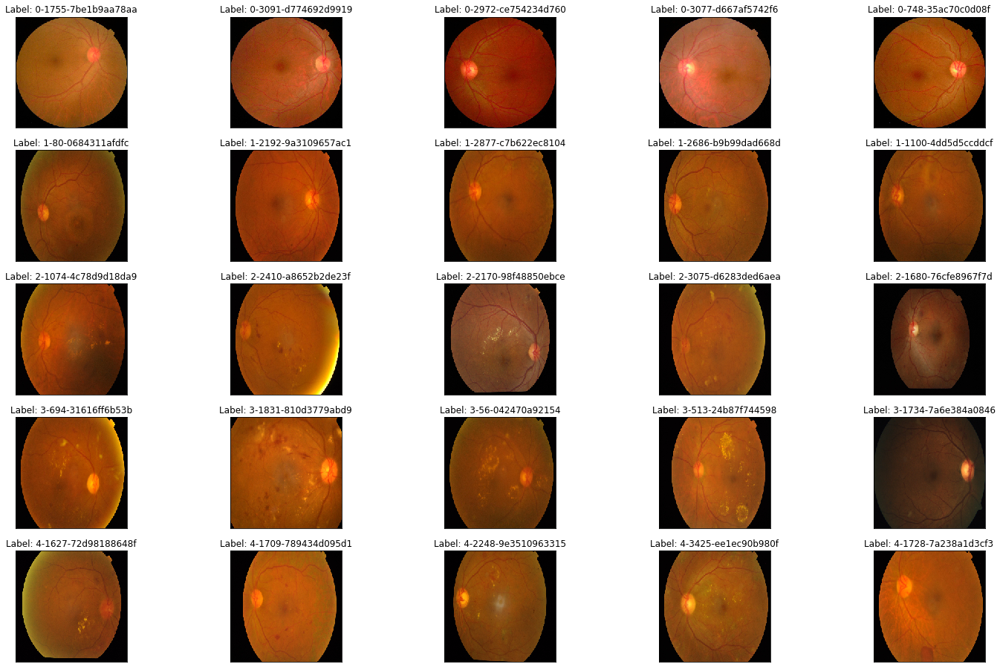

In [3]:
import matplotlib.pyplot as plt
import cv2
fig = plt.figure(figsize=(25, 16))
IMG_SIZE=224
# display 10 images from each class
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )
        

In [7]:
image

array([[[3, 1, 2],
        [3, 1, 2],
        [3, 1, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]],

       [[3, 1, 2],
        [3, 1, 2],
        [3, 1, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]],

       [[3, 1, 2],
        [3, 1, 2],
        [3, 1, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]],

       ...,

       [[2, 2, 2],
        [2, 2, 2],
        [2, 2, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]],

       [[2, 2, 2],
        [1, 1, 1],
        [2, 2, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]],

       [[2, 2, 2],
        [3, 1, 2],
        [3, 1, 2],
        ...,
        [3, 1, 2],
        [3, 1, 2],
        [3, 1, 2]]], dtype=uint8)

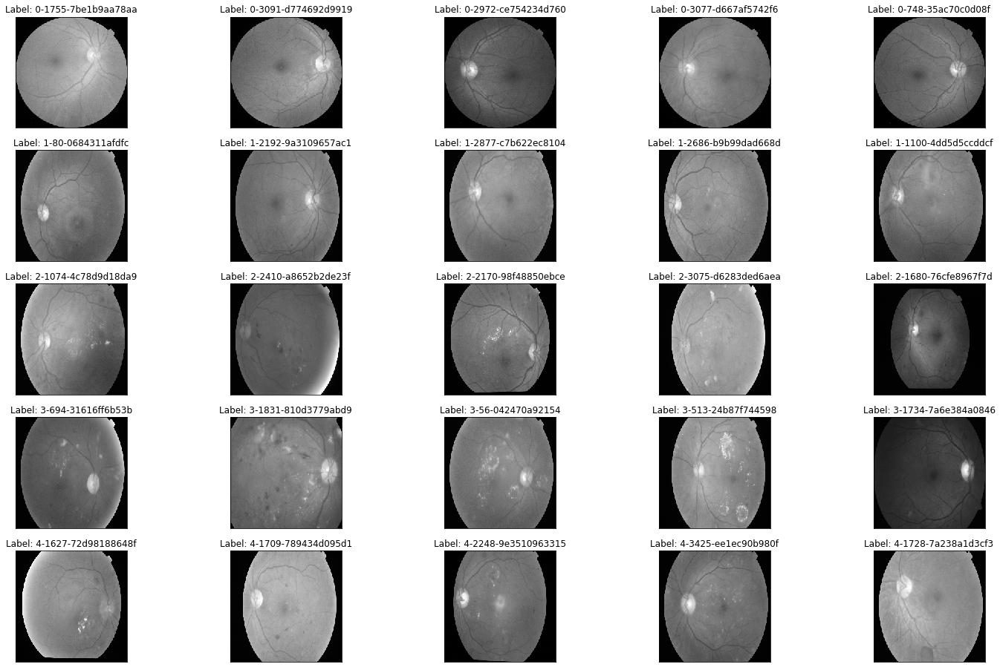

In [4]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image=cv2.addWeighted ( image, 0 , cv2.GaussianBlur( image , (0 ,0 ) , 10) ,-4 ,128)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

In [10]:
train_y.unique()

array([3, 2, 0, 4, 1], dtype=int64)

train_images/7be1b9aa78aa.png
train_images/d774692d9919.png
train_images/ce754234d760.png
train_images/d667af5742f6.png
train_images/35ac70c0d08f.png
train_images/0684311afdfc.png
train_images/9a3109657ac1.png
train_images/c7b622ec8104.png
train_images/b9b99dad668d.png
train_images/4dd5d5ccddcf.png
train_images/4c78d9d18da9.png
train_images/a8652b2de23f.png
train_images/98f48850ebce.png
train_images/d6283ded6aea.png
train_images/76cfe8967f7d.png
train_images/31616ff6b53b.png
train_images/810d3779abd9.png
train_images/042470a92154.png
train_images/24b87f744598.png
train_images/7a6e384a0846.png
train_images/72d98188648f.png
train_images/789434d095d1.png
train_images/9e3510963315.png
train_images/ee1ec90b980f.png
train_images/7a238a1d3cf3.png


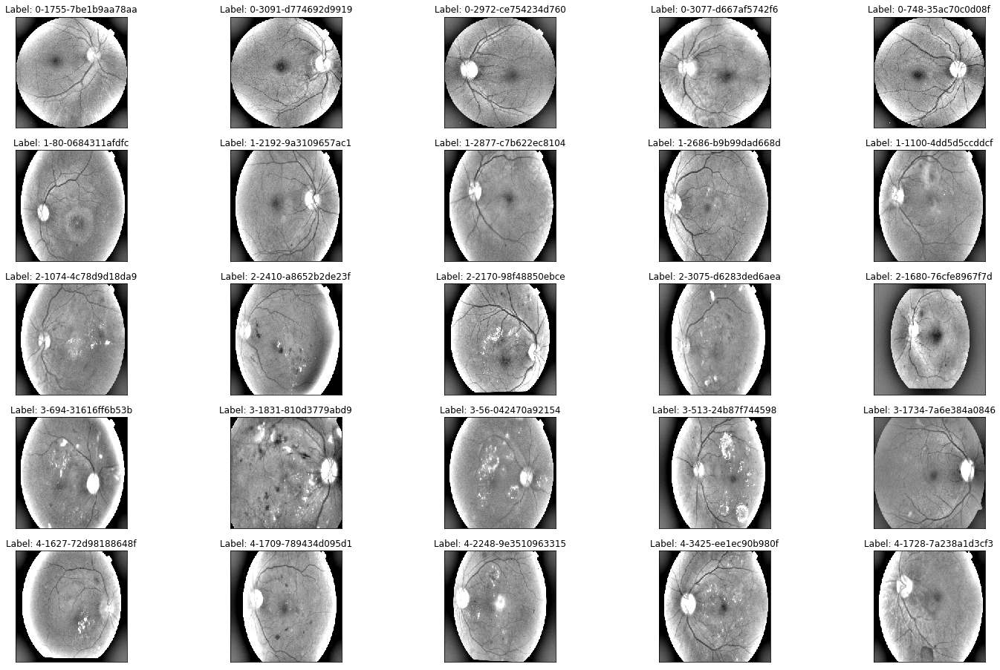

In [11]:
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128) # the trick is to add this line
        print(path)
        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

In [6]:
def crop_image1(img,tol=7):
    # img is image data
    # tol  is tolerance
        
    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]

def crop_image_from_gray(img,tol=7):
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol
        
        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
        if (check_shape == 0): # image is too dark so that we crop out everything,
            return img # return original image
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
    #         print(img1.shape,img2.shape,img3.shape)
            img = np.stack([img1,img2,img3],axis=-1)
    #         print(img.shape)
        return img

In [7]:
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
    return image

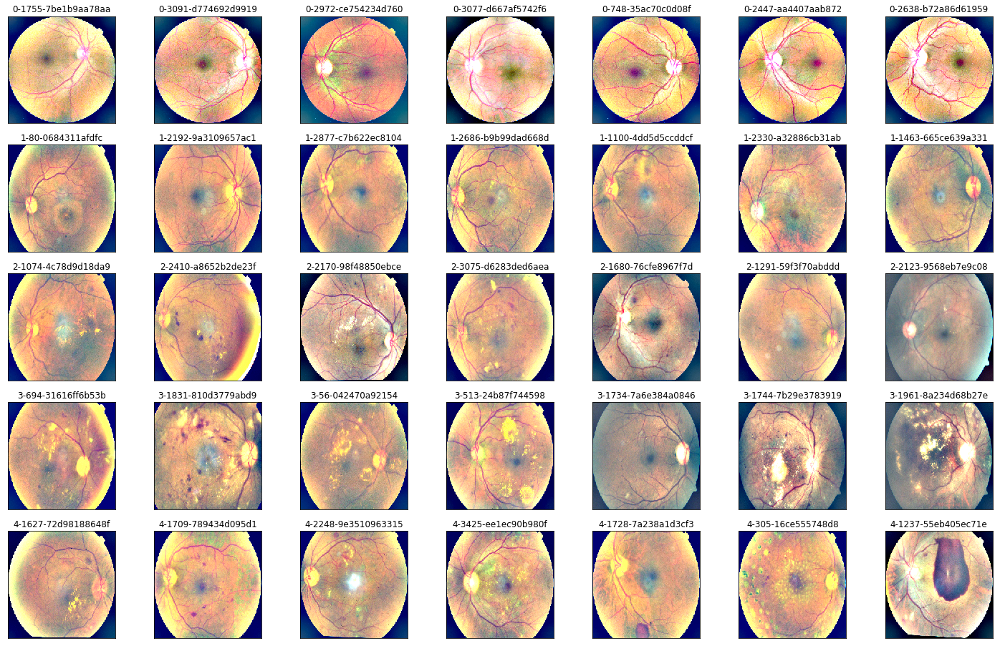

In [8]:
import numpy as np
NUM_SAMP=7
fig = plt.figure(figsize=(25, 16))
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"train_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=30)

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )

In [9]:
import json
import math
import os

import cv2
from PIL import Image
import numpy as np
from keras import layers
from keras.applications import DenseNet121
from keras.callbacks import Callback, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
from tqdm import tqdm

%matplotlib inline

C:\Users\AFNAN\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
C:\Users\AFNAN\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\AFNAN\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\AFNAN\Anaconda3\lib\site-packages\tensorflow\python\framework\

In [10]:


def preprocess_image(image_path, desired_size=224):
    im = Image.open(image_path)
    im = im.resize((desired_size, )*2, resample=Image.LANCZOS)#check must
#     im = im.resize((desired_size, )*2)
    
    return im
N = df_test.shape[0]
x_test = np.empty((N, 224, 224, 3), dtype=np.uint8)

for i, image_id in enumerate(tqdm(df_test['id_code'])):
    x_test[i, :, :, :] = preprocess_image(
        f'test_images/{image_id}.png'
    )

100%|██████████████████████████████████████████████████████████████████████████████| 1928/1928 [03:08<00:00, 10.24it/s]


In [11]:
# model.summary()
def load_image_ben_orig(path,resize=True,crop=False,norm255=True,keras=False):
    image = cv2.imread(path)
    
#     if crop:
#         image = crop_image(image)
    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
#     if resize:
#         image = cv2.resize(image,(SIZE,SIZE))
        
    image=cv2.addWeighted( image,4, cv2.GaussianBlur( image , (0,0) ,  10) ,-4 ,128)
#     image=cv2.addWeighted( image,4, cv2.medianBlur( image , 10) ,-4 ,128)
    
    # NOTE plt.imshow can accept both int (0-255) or float (0-1), but deep net requires (0-1)
    if norm255:
        return image/255
    elif keras:
        #see https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py for mode
        #see https://github.com/keras-team/keras-applications/blob/master/keras_applications/xception.py for inception,xception mode
        #the use of tf based preprocessing (- and / by 127 respectively) will results in [-1,1] so it will not visualize correctly (directly)
        image = np.expand_dims(image, axis=0)
        return preprocess_input(image)[0]
    else:
        return image.astype(np.int16)
    
    return image

def transform_image_ben(img,resize=True,crop=False,norm255=True,keras=False):  
    image=cv2.addWeighted( img,4, cv2.GaussianBlur( img , (0,0) ,  10) ,-4 ,128)
    
    # NOTE plt.imshow can accept both int (0-255) or float (0-1), but deep net requires (0-1)
    if norm255:
        return image/255
    elif keras:
        image = np.expand_dims(image, axis=0)
        return preprocess_input(image)[0]
    else:
        return image.astype(np.int16)
    
    return image

In [12]:
from keras import layers
from keras.models import Model
import keras.backend as K

In [13]:
K.clear_session()
densenet = DenseNet121(
    weights=None,
    include_top=False,
    input_shape=(None,None,3)
)

In [14]:
GAP_layer = layers.GlobalAveragePooling2D()
drop_layer = layers.Dropout(0.5)
dense_layer = layers.Dense(5, activation='sigmoid', name='final_output')

In [15]:
def build_model_sequential():
    model = Sequential()
    model.add(densenet)
    model.add(GAP_layer)
    model.add(drop_layer)
    model.add(dense_layer)
    return model
modelA = build_model_sequential()
modelA.load_weights('dense_xhlulu_731.h5')

modelA.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Model)          (None, None, None, 1024)  7037504   
_________________________________________________________________
global_average_pooling2d_1 ( (None, 1024)              0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)              0         
_________________________________________________________________
final_output (Dense)         (None, 5)                 5125      
Total params: 7,042,629
Trainable params: 6,958,981
Non-trainable params: 83,648
_________________________________________________________________


In [16]:
def build_model_functional():
    base_model = densenet
    
    x = GAP_layer(base_model.layers[-1].output)
    x = drop_layer(x)
    final_output = dense_layer(x)
    model = Model(base_model.layers[0].input, final_output)
    
    return model

In [17]:
model = build_model_functional() # with pretrained weights, and layers we want
model.summary()


__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
zero_padding2d_1 (ZeroPadding2D (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, None, None, 6 9408        zero_padding2d_1[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, None, None, 6 256         conv1/conv[0][0]                 
__________________________________________________________________________________________________
conv1/relu

conv3_block4_1_conv (Conv2D)    (None, None, None, 1 28672       conv3_block4_0_relu[0][0]        
__________________________________________________________________________________________________
conv3_block4_1_bn (BatchNormali (None, None, None, 1 512         conv3_block4_1_conv[0][0]        
__________________________________________________________________________________________________
conv3_block4_1_relu (Activation (None, None, None, 1 0           conv3_block4_1_bn[0][0]          
__________________________________________________________________________________________________
conv3_block4_2_conv (Conv2D)    (None, None, None, 3 36864       conv3_block4_1_relu[0][0]        
__________________________________________________________________________________________________
conv3_block4_concat (Concatenat (None, None, None, 2 0           conv3_block3_concat[0][0]        
                                                                 conv3_block4_2_conv[0][0]        
__________

conv4_block2_2_conv (Conv2D)    (None, None, None, 3 36864       conv4_block2_1_relu[0][0]        
__________________________________________________________________________________________________
conv4_block2_concat (Concatenat (None, None, None, 3 0           conv4_block1_concat[0][0]        
                                                                 conv4_block2_2_conv[0][0]        
__________________________________________________________________________________________________
conv4_block3_0_bn (BatchNormali (None, None, None, 3 1280        conv4_block2_concat[0][0]        
__________________________________________________________________________________________________
conv4_block3_0_relu (Activation (None, None, None, 3 0           conv4_block3_0_bn[0][0]          
__________________________________________________________________________________________________
conv4_block3_1_conv (Conv2D)    (None, None, None, 1 40960       conv4_block3_0_relu[0][0]        
__________

__________________________________________________________________________________________________
conv4_block13_2_conv (Conv2D)   (None, None, None, 3 36864       conv4_block13_1_relu[0][0]       
__________________________________________________________________________________________________
conv4_block13_concat (Concatena (None, None, None, 6 0           conv4_block12_concat[0][0]       
                                                                 conv4_block13_2_conv[0][0]       
__________________________________________________________________________________________________
conv4_block14_0_bn (BatchNormal (None, None, None, 6 2688        conv4_block13_concat[0][0]       
__________________________________________________________________________________________________
conv4_block14_0_relu (Activatio (None, None, None, 6 0           conv4_block14_0_bn[0][0]         
__________________________________________________________________________________________________
conv4_bloc

conv4_block24_1_relu (Activatio (None, None, None, 1 0           conv4_block24_1_bn[0][0]         
__________________________________________________________________________________________________
conv4_block24_2_conv (Conv2D)   (None, None, None, 3 36864       conv4_block24_1_relu[0][0]       
__________________________________________________________________________________________________
conv4_block24_concat (Concatena (None, None, None, 1 0           conv4_block23_concat[0][0]       
                                                                 conv4_block24_2_conv[0][0]       
__________________________________________________________________________________________________
pool4_bn (BatchNormalization)   (None, None, None, 1 4096        conv4_block24_concat[0][0]       
__________________________________________________________________________________________________
pool4_relu (Activation)         (None, None, None, 1 0           pool4_bn[0][0]                   
__________

__________________________________________________________________________________________________
conv5_block11_0_bn (BatchNormal (None, None, None, 8 3328        conv5_block10_concat[0][0]       
__________________________________________________________________________________________________
conv5_block11_0_relu (Activatio (None, None, None, 8 0           conv5_block11_0_bn[0][0]         
__________________________________________________________________________________________________
conv5_block11_1_conv (Conv2D)   (None, None, None, 1 106496      conv5_block11_0_relu[0][0]       
__________________________________________________________________________________________________
conv5_block11_1_bn (BatchNormal (None, None, None, 1 512         conv5_block11_1_conv[0][0]       
__________________________________________________________________________________________________
conv5_block11_1_relu (Activatio (None, None, None, 1 0           conv5_block11_1_bn[0][0]         
__________

In [18]:
def gen_heatmap_img(img, model0, layer_name='last_conv_layer',viz_img=None,orig_img=None):
    preds_raw = model0.predict(img[np.newaxis])
    preds = preds_raw > 0.5 # use the same threshold as @xhlulu original kernel
    class_idx = (preds.astype(int).sum(axis=1) - 1)[0]#heatmap
#     print(class_idx, class_idx.shape)
    class_output_tensor = model0.output[:, class_idx]
    
    viz_layer = model0.get_layer(layer_name)
    grads = K.gradients(
                        class_output_tensor ,
                        viz_layer.output
                        )[0] # gradients of viz_layer wrt output_tensor of predicted class
    
    pooled_grads=K.mean(grads,axis=(0,1,2))
    iterate=K.function([model0.input],[pooled_grads, viz_layer.output[0]])
    
    pooled_grad_value, viz_layer_out_value = iterate([img[np.newaxis]])
    
    for i in range(pooled_grad_value.shape[0]):
        viz_layer_out_value[:,:,i] *= pooled_grad_value[i]
    
    heatmap = np.mean(viz_layer_out_value, axis=-1)
    heatmap = np.maximum(heatmap,0)
    heatmap /= np.max(heatmap)

    viz_img=cv2.resize(viz_img,(img.shape[1],img.shape[0]))
    heatmap=cv2.resize(heatmap,(viz_img.shape[1],viz_img.shape[0]))
    
    heatmap_color = cv2.applyColorMap(np.uint8(heatmap*255), cv2.COLORMAP_SPRING)/255
    heated_img = heatmap_color*0.5 + viz_img*0.5
    
    print('raw output from model : ')
    print_pred(preds_raw)
    
    if orig_img is None:
        show_Nimages([img,viz_img,heatmap_color,heated_img])
    else:
        show_Nimages([orig_img,img,viz_img,heatmap_color,heated_img])
    
    plt.show()
    return heated_img

In [19]:
def show_image(image,figsize=None,title=None):
    
    if figsize is not None:
        fig = plt.figure(figsize=figsize)
#     else: # crash!!
#         fig = plt.figure()
        
    if image.ndim == 2:
        plt.imshow(image,cmap='gray')
    else:
        plt.imshow(image)
        
    if title is not None:
        plt.title(title)

def show_Nimages(imgs,scale=1):

    N=len(imgs)
    fig = plt.figure(figsize=(25/scale, 16/scale))
    for i, img in enumerate(imgs):
        ax = fig.add_subplot(1, N, i + 1, xticks=[], yticks=[])
        show_image(img)
        
def print_pred(array_of_classes):
    xx = array_of_classes
    s1,s2 = xx.shape
    for i in range(s1):
        for j in range(s2):
            print('%.3f ' % xx[i,j],end='')
        print('')

test pic no.1
raw output from model : 
1.000 0.966 0.520 0.268 0.109 


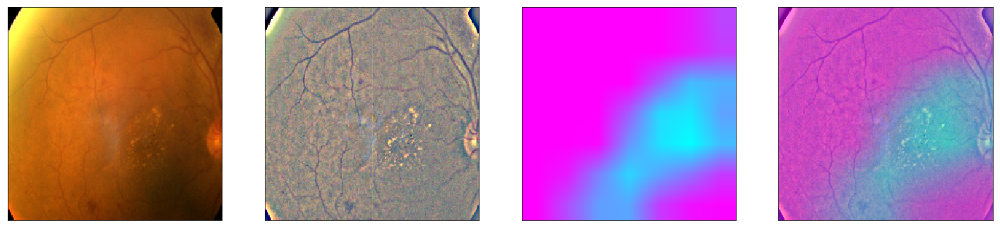

test pic no.2
raw output from model : 
0.998 0.999 0.999 0.931 0.153 


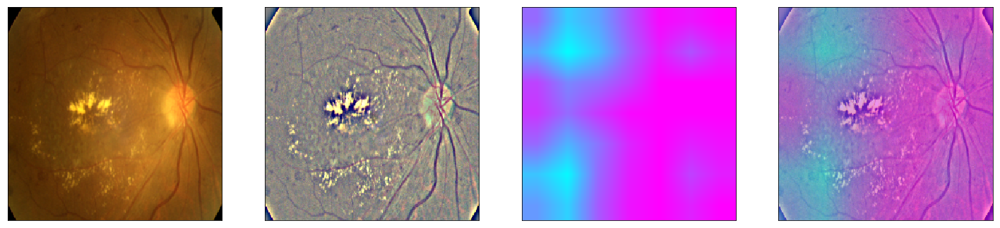

test pic no.3
raw output from model : 
0.999 0.998 0.991 0.812 0.076 


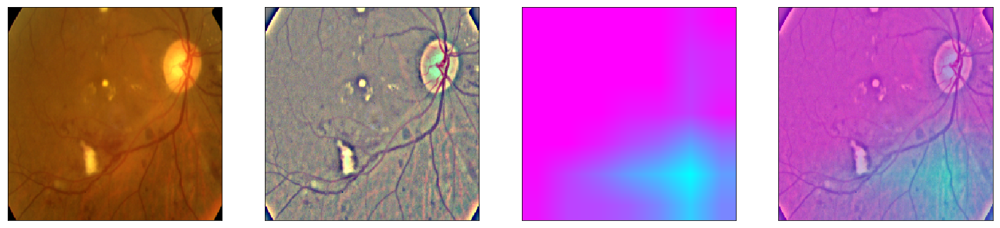

test pic no.4
raw output from model : 
0.998 0.998 0.758 0.031 0.017 


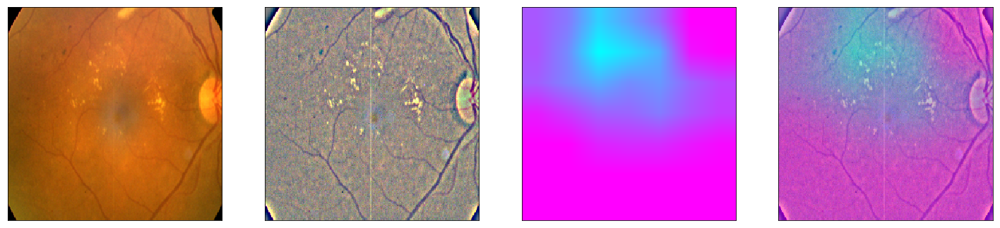

test pic no.5
raw output from model : 
0.996 0.992 0.900 0.066 0.024 


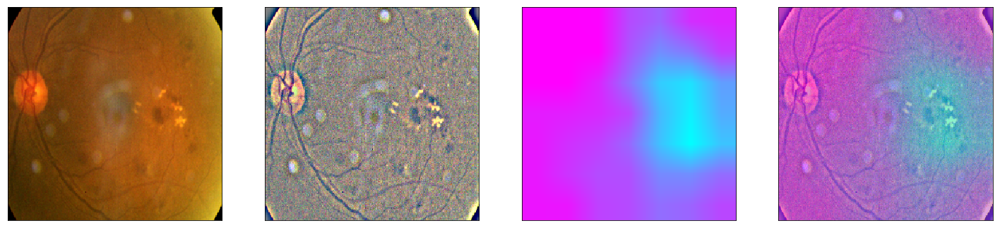

test pic no.6
raw output from model : 
0.994 0.995 0.959 0.172 0.042 


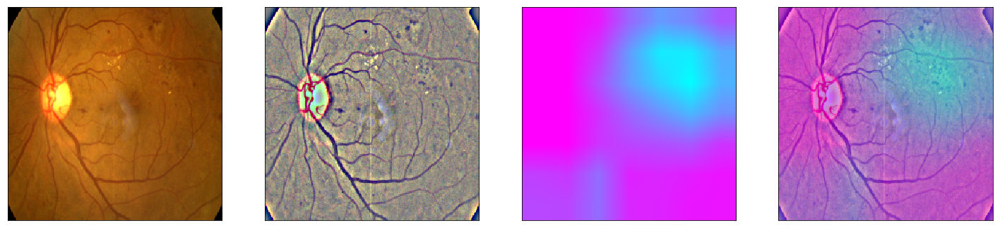

test pic no.7
raw output from model : 
0.998 1.000 0.999 0.949 0.108 


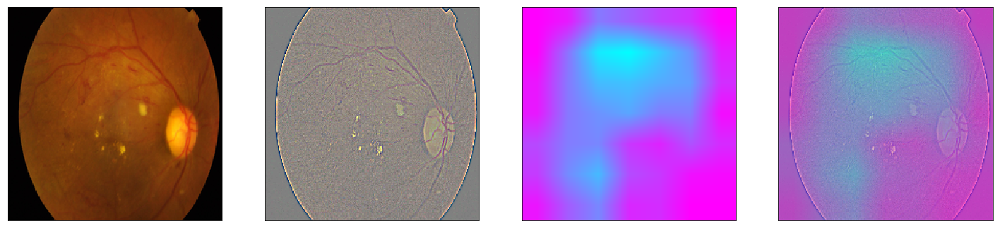

test pic no.8
raw output from model : 
0.996 0.226 0.062 0.011 0.007 


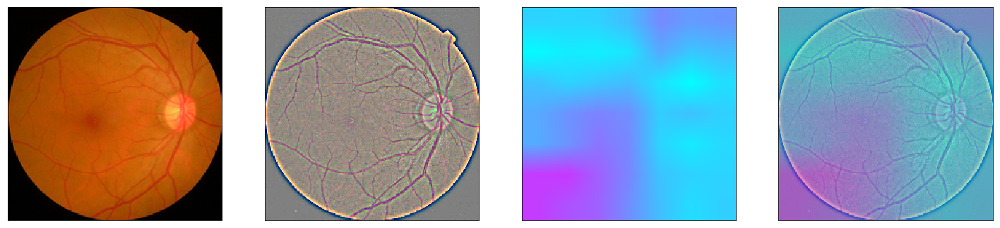

test pic no.9
raw output from model : 
0.998 1.000 0.999 0.953 0.068 


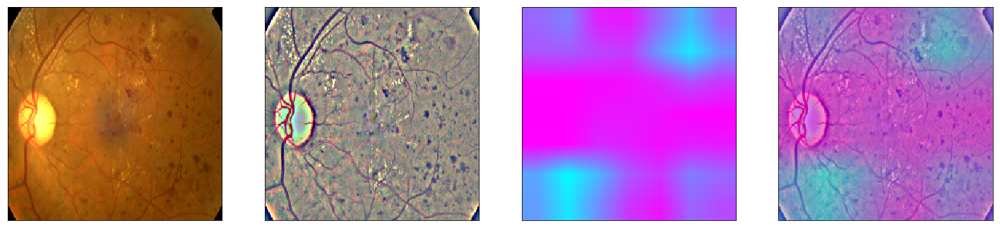

test pic no.10
raw output from model : 
0.995 0.512 0.102 0.004 0.003 


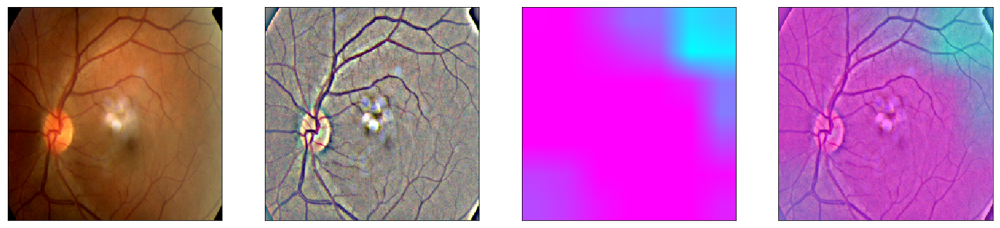

In [20]:
NUM_SAMP=10
SEED=77
layer_name = 'relu' #'conv5_block16_concat'
for i, (idx, row) in enumerate(df_test[:NUM_SAMP].iterrows()):
    path=f"test_images/{row['id_code']}.png"
    ben_img = load_image_ben_orig(path)
    input_img = np.empty((1,224, 224, 3), dtype=np.uint8)
    input_img[0,:,:,:] = preprocess_image(path)
        
    print('test pic no.%d' % (i+1))
    _ = gen_heatmap_img(input_img[0],
                        model, layer_name=layer_name,viz_img=ben_img)

There are many interesting observations here. To name a few,

The 1st, 4th, 5th, 6th predictions look great
The 2nd prediction misses the whole big spots in the middle
The 3rd and 7th predictions also miss important spots
In the 9th image, bloody spots are all over the places and the model is able to capture 4 regions, not all.
The 8th and 10th images look normal to me, but in the 10th, it looks like the model capture a spuriou (false) feature and identify severity level 1.